# 1. Load Library and Load Dataset

In [1]:
# Library
import sys
import numpy as np # Linear Algebra
np.set_printoptions(threshold=sys.maxsize)
import pandas as pd # Data Processing, CSV file I/O (e.g. pd.read_csv)

# Library for data visualization
import matplotlib.pyplot as plt

# KMeans Clustering
from sklearn.cluster import KMeans

# Silhouette Coefficient
from sklearn.metrics import silhouette_score

# Preprocessing
from sklearn import preprocessing

from sklearn.preprocessing import Normalizer 

In [2]:
# Reading Dataset
data_inventori = pd.read_excel("Dataset/Dataset18_Inventori.xlsx")

print('Dataset : ')
print(data_inventori)

Dataset : 
          No     Plu                      Description TAG  Bulan  Sales  \
0          1     234                   DJI SAM SOE 12   T     12   19.0   
1          2     246               GG PROFESSIONAL 16   M     12    2.0   
2          3     259               WISMILAK KRETEK 12   M     12    0.0   
3          4     275           LUCKY STRIKE FILTER 20   T     12    4.0   
4          5     320             LUCKY STRIKE COOL 20   T     12    4.0   
...      ...     ...                              ...  ..    ...    ...   
12626  12627  990223     SUPER O2 SPORT WTR PET 600ML   B      2    0.0   
12627  12628  990261  COCOBIT SPLASH LYCHEE PET 350ML   M      2    0.0   
12628  12629  990291              COCA COLA PET 390ML   F      2   10.0   
12629  12630  990292                 SPRITE PET 390ML   F      2   45.0   
12630  12631  990293          FANTA STRAWBERRY PET 39   F      2    3.0   

       Stock Out  PKM Exist  Avg Sales / Hari  MPKM Toko  PKM Toko   N+  \
0            

# 2. Data Preprocessing

In [3]:
# To Show Dataset Information about Non Null and Null
print('Dataset Information : ')
data_inventori.info()

Dataset Information : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12631 entries, 0 to 12630
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   No                12631 non-null  int64  
 1   Plu               12631 non-null  int64  
 2   Description       12631 non-null  object 
 3   TAG               12631 non-null  object 
 4   Bulan             12631 non-null  int64  
 5   Sales             12631 non-null  float64
 6   Stock Out         12631 non-null  float64
 7   PKM Exist         12631 non-null  float64
 8   Avg Sales / Hari  12631 non-null  float64
 9   MPKM Toko         12631 non-null  float64
 10  PKM Toko          12631 non-null  float64
 11  N+                12631 non-null  float64
 12  Min Disp          12631 non-null  float64
 13  Minor             12631 non-null  float64
 14  Stock             12631 non-null  float64
 15  DSI PKM           12631 non-null  float64
 16  DSI OH           

In [4]:
# This is the process for retrieving positive value data
data_inventori1 = data_inventori.loc[data_inventori['Stock']>=0]
data_inventori1.reset_index(drop=True, inplace=True)
data_inventori1

,No,Plu,Description,TAG,Bulan,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH,Cluster
0,1,234,DJI SAM SOE 12,T,12,19.0,0.0,27.0,1.0,12.0,27.0,0.0,3.0,5.0,23.0,54.0,46.000,0
1,2,246,GG PROFESSIONAL 16,M,12,2.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,11.0,171.0,235.000,0
2,3,259,WISMILAK KRETEK 12,M,12,0.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,7.0,0.0,0.000,0
3,4,275,LUCKY STRIKE FILTER 20,T,12,4.0,0.0,15.0,0.0,15.0,15.0,0.0,2.0,5.0,19.0,74.0,94.000,0
4,5,320,LUCKY STRIKE COOL 20,T,12,4.0,0.0,8.0,0.0,8.0,8.0,0.0,2.0,5.0,21.0,128.0,336.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12626,12627,990223,SUPER O2 SPORT WTR PET 600ML,B,2,0.0,0.0,11.0,0.0,4.0,4.0,7.0,2.0,2.0,48.0,108.0,1.296,0
12627,12628,990261,COCOBIT SPLASH LYCHEE PET 350ML,M,2,0.0,0.0,9.0,0.0,5.0,5.0,4.0,1.0,2.0,9.0,135.0,243.000,0
12628,12629,990291,COCA COLA PET 390ML,F,2,10.0,0.0,23.0,0.0,22.0,23.0,0.0,4.0,12.0,22.0,52.0,50.000,0
12629,12630,990292,SPRITE PET 390ML,F,2,45.0,0.0,37.0,1.0,28.0,37.0,0.0,4.0,12.0,34.0,26.0,24.000,0


In [5]:
# This is process of attributes allocation
data_inventori2 = data_inventori1[['Sales', 'Stock Out', 'PKM Exist', 'Avg Sales / Hari', 'MPKM Toko', 'PKM Toko', 'N+', 'Min Disp', 'Minor', 'Stock', 'DSI PKM', 'DSI OH']]
data_inventori2

,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH
0,19.0,0.0,27.0,1.0,12.0,27.0,0.0,3.0,5.0,23.0,54.0,46.000
1,2.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,11.0,171.0,235.000
2,0.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,7.0,0.0,0.000
3,4.0,0.0,15.0,0.0,15.0,15.0,0.0,2.0,5.0,19.0,74.0,94.000
4,4.0,0.0,8.0,0.0,8.0,8.0,0.0,2.0,5.0,21.0,128.0,336.000
...,...,...,...,...,...,...,...,...,...,...,...,...
12626,0.0,0.0,11.0,0.0,4.0,4.0,7.0,2.0,2.0,48.0,108.0,1.296
12627,0.0,0.0,9.0,0.0,5.0,5.0,4.0,1.0,2.0,9.0,135.0,243.000
12628,10.0,0.0,23.0,0.0,22.0,23.0,0.0,4.0,12.0,22.0,52.0,50.000
12629,45.0,0.0,37.0,1.0,28.0,37.0,0.0,4.0,12.0,34.0,26.0,24.000


In [6]:
# This is process of scaling data 
data_inventoriscaled = preprocessing.MinMaxScaler().fit_transform(data_inventori2)
data_inventoriscaled

array([[3.94190871e-02, 0.00000000e+00, 7.10526316e-04, 1.92307692e-02,
        4.80000000e-03, 7.10526316e-04, 0.00000000e+00, 6.00000000e-03,
        2.00100050e-03, 6.47431386e-04, 1.85185185e-02, 1.62257496e-02],
       [4.14937759e-03, 0.00000000e+00, 2.10526316e-04, 0.00000000e+00,
        3.20000000e-03, 2.10526316e-04, 0.00000000e+00, 6.00000000e-03,
        2.00100050e-03, 3.09641098e-04, 5.86419753e-02, 8.28924162e-02],
       [0.00000000e+00, 0.00000000e+00, 2.10526316e-04, 0.00000000e+00,
        3.20000000e-03, 2.10526316e-04, 0.00000000e+00, 6.00000000e-03,
        2.00100050e-03, 1.97044335e-04, 0.00000000e+00, 0.00000000e+00],
       [8.29875519e-03, 0.00000000e+00, 3.94736842e-04, 0.00000000e+00,
        6.00000000e-03, 3.94736842e-04, 0.00000000e+00, 4.00000000e-03,
        2.00100050e-03, 5.34834624e-04, 2.53772291e-02, 3.31569665e-02],
       [8.29875519e-03, 0.00000000e+00, 2.10526316e-04, 0.00000000e+00,
        3.20000000e-03, 2.10526316e-04, 0.00000000e+00, 4.00

In [7]:
# This is process to change the Data to be Data Frame
data_inventori3 = pd.DataFrame(data_inventoriscaled, columns=data_inventori2.columns[:13])
data_inventori3.head()

,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH
0,0.039419,0.0,0.000711,0.019231,0.0048,0.000711,0.0,0.006,0.002001,0.000647,0.018519,0.016226
1,0.004149,0.0,0.000211,0.000000,0.0032,0.000211,0.0,0.006,0.002001,0.000310,0.058642,0.082892
2,0.000000,0.0,0.000211,0.000000,0.0032,0.000211,0.0,0.006,0.002001,0.000197,0.000000,0.000000
3,0.008299,0.0,0.000395,0.000000,0.0060,0.000395,0.0,0.004,0.002001,0.000535,0.025377,0.033157
4,0.008299,0.0,0.000211,0.000000,0.0032,0.000211,0.0,0.004,0.002001,0.000591,0.043896,0.118519


# 3. Model Building

In [8]:
# This is Process to select the attributes 
X = data_inventori3[['Sales', 'Stock Out', 'PKM Exist', 'Avg Sales / Hari', 'MPKM Toko', 'PKM Toko', 'N+', 'Min Disp', 'Minor', 'Stock', 'DSI PKM', 'DSI OH']]
X

,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH
0,0.039419,0.0,0.000711,0.019231,0.0048,0.000711,0.000000,0.006,0.002001,0.000647,0.018519,0.016226
1,0.004149,0.0,0.000211,0.000000,0.0032,0.000211,0.000000,0.006,0.002001,0.000310,0.058642,0.082892
2,0.000000,0.0,0.000211,0.000000,0.0032,0.000211,0.000000,0.006,0.002001,0.000197,0.000000,0.000000
3,0.008299,0.0,0.000395,0.000000,0.0060,0.000395,0.000000,0.004,0.002001,0.000535,0.025377,0.033157
4,0.008299,0.0,0.000211,0.000000,0.0032,0.000211,0.000000,0.004,0.002001,0.000591,0.043896,0.118519
...,...,...,...,...,...,...,...,...,...,...,...,...
12626,0.000000,0.0,0.000289,0.000000,0.0016,0.000105,0.023026,0.004,0.000500,0.001351,0.037037,0.000457
12627,0.000000,0.0,0.000237,0.000000,0.0020,0.000132,0.013158,0.002,0.000500,0.000253,0.046296,0.085714
12628,0.020747,0.0,0.000605,0.000000,0.0088,0.000605,0.000000,0.008,0.005503,0.000619,0.017833,0.017637
12629,0.093361,0.0,0.000974,0.019231,0.0112,0.000974,0.000000,0.008,0.005503,0.000957,0.008916,0.008466


In [9]:
# This is process to change the data to be array
data_inventori2numpy = data_inventori2.to_numpy()
data_inventori2numpy

array([[1.9000e+01, 0.0000e+00, 2.7000e+01, 1.0000e+00, 1.2000e+01,
        2.7000e+01, 0.0000e+00, 3.0000e+00, 5.0000e+00, 2.3000e+01,
        5.4000e+01, 4.6000e+01],
       [2.0000e+00, 0.0000e+00, 8.0000e+00, 0.0000e+00, 8.0000e+00,
        8.0000e+00, 0.0000e+00, 3.0000e+00, 5.0000e+00, 1.1000e+01,
        1.7100e+02, 2.3500e+02],
       [0.0000e+00, 0.0000e+00, 8.0000e+00, 0.0000e+00, 8.0000e+00,
        8.0000e+00, 0.0000e+00, 3.0000e+00, 5.0000e+00, 7.0000e+00,
        0.0000e+00, 0.0000e+00],
       [4.0000e+00, 0.0000e+00, 1.5000e+01, 0.0000e+00, 1.5000e+01,
        1.5000e+01, 0.0000e+00, 2.0000e+00, 5.0000e+00, 1.9000e+01,
        7.4000e+01, 9.4000e+01],
       [4.0000e+00, 0.0000e+00, 8.0000e+00, 0.0000e+00, 8.0000e+00,
        8.0000e+00, 0.0000e+00, 2.0000e+00, 5.0000e+00, 2.1000e+01,
        1.2800e+02, 3.3600e+02],
       [2.0000e+00, 4.0000e+00, 9.0000e+00, 0.0000e+00, 2.0000e+00,
        9.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00, 6.0000e+00,
        2.8800e+02,

In [10]:
# Define 2 variable for describing the maximum and the minimum of data
mn = np.min(data_inventori2numpy, axis=0)  
mx = np.max(data_inventori2numpy, axis=0)  

In [11]:
mn

array([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])

In [12]:
mx

array([4.8200e+02, 3.1000e+01, 3.8000e+04, 5.2000e+01, 2.5000e+03,
       3.8000e+04, 3.0400e+02, 5.0000e+02, 2.0000e+03, 3.5525e+04,
       2.9160e+03, 2.8350e+03])

In [13]:
# This is process to change the data to array
data_inventori3numpy = data_inventori3.to_numpy()
data_inventori3numpy

array([[3.94190871e-02, 0.00000000e+00, 7.10526316e-04, 1.92307692e-02,
        4.80000000e-03, 7.10526316e-04, 0.00000000e+00, 6.00000000e-03,
        2.00100050e-03, 6.47431386e-04, 1.85185185e-02, 1.62257496e-02],
       [4.14937759e-03, 0.00000000e+00, 2.10526316e-04, 0.00000000e+00,
        3.20000000e-03, 2.10526316e-04, 0.00000000e+00, 6.00000000e-03,
        2.00100050e-03, 3.09641098e-04, 5.86419753e-02, 8.28924162e-02],
       [0.00000000e+00, 0.00000000e+00, 2.10526316e-04, 0.00000000e+00,
        3.20000000e-03, 2.10526316e-04, 0.00000000e+00, 6.00000000e-03,
        2.00100050e-03, 1.97044335e-04, 0.00000000e+00, 0.00000000e+00],
       [8.29875519e-03, 0.00000000e+00, 3.94736842e-04, 0.00000000e+00,
        6.00000000e-03, 3.94736842e-04, 0.00000000e+00, 4.00000000e-03,
        2.00100050e-03, 5.34834624e-04, 2.53772291e-02, 3.31569665e-02],
       [8.29875519e-03, 0.00000000e+00, 2.10526316e-04, 0.00000000e+00,
        3.20000000e-03, 2.10526316e-04, 0.00000000e+00, 4.00

In [14]:
# This is process to return data to be as before
data_inventori3 = (data_inventori3numpy * (mx - mn)) + mn
data_inventori3

array([[1.9000e+01, 0.0000e+00, 2.7000e+01, 1.0000e+00, 1.2000e+01,
        2.7000e+01, 0.0000e+00, 3.0000e+00, 5.0000e+00, 2.3000e+01,
        5.4000e+01, 4.6000e+01],
       [2.0000e+00, 0.0000e+00, 8.0000e+00, 0.0000e+00, 8.0000e+00,
        8.0000e+00, 0.0000e+00, 3.0000e+00, 5.0000e+00, 1.1000e+01,
        1.7100e+02, 2.3500e+02],
       [0.0000e+00, 0.0000e+00, 8.0000e+00, 0.0000e+00, 8.0000e+00,
        8.0000e+00, 0.0000e+00, 3.0000e+00, 5.0000e+00, 7.0000e+00,
        0.0000e+00, 0.0000e+00],
       [4.0000e+00, 0.0000e+00, 1.5000e+01, 0.0000e+00, 1.5000e+01,
        1.5000e+01, 0.0000e+00, 2.0000e+00, 5.0000e+00, 1.9000e+01,
        7.4000e+01, 9.4000e+01],
       [4.0000e+00, 0.0000e+00, 8.0000e+00, 0.0000e+00, 8.0000e+00,
        8.0000e+00, 0.0000e+00, 2.0000e+00, 5.0000e+00, 2.1000e+01,
        1.2800e+02, 3.3600e+02],
       [2.0000e+00, 4.0000e+00, 9.0000e+00, 0.0000e+00, 2.0000e+00,
        9.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00, 6.0000e+00,
        2.8800e+02,

In [15]:
# This is process to change the data tobe a dataframe
data_inventori3 = pd.DataFrame(data_inventori3, columns=data_inventori2.columns[:12])
data_inventori3

,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH
0,19.0,0.0,27.0,1.0,12.0,27.0,0.0,3.0,5.0,23.0,54.0,46.000
1,2.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,11.0,171.0,235.000
2,0.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,7.0,0.0,0.000
3,4.0,0.0,15.0,0.0,15.0,15.0,0.0,2.0,5.0,19.0,74.0,94.000
4,4.0,0.0,8.0,0.0,8.0,8.0,0.0,2.0,5.0,21.0,128.0,336.000
...,...,...,...,...,...,...,...,...,...,...,...,...
12626,0.0,0.0,11.0,0.0,4.0,4.0,7.0,2.0,2.0,48.0,108.0,1.296
12627,0.0,0.0,9.0,0.0,5.0,5.0,4.0,1.0,2.0,9.0,135.0,243.000
12628,10.0,0.0,23.0,0.0,22.0,23.0,0.0,4.0,12.0,22.0,52.0,50.000
12629,45.0,0.0,37.0,1.0,28.0,37.0,0.0,4.0,12.0,34.0,26.0,24.000


In [16]:
# This is process to build model for k equals to 2
model = KMeans(n_clusters=2, init = 'k-means++', random_state=None)
# fit the model
model.fit(X)

KMeans(n_clusters=2)

In [17]:
# This is process to predict the values
y_predicted = model.fit_predict(X)

In [18]:
# This is process to add the new column to the dataframe
data_inventori3['Cluster'] = y_predicted
# display the dataframe
data_inventori3

,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH,Cluster
0,19.0,0.0,27.0,1.0,12.0,27.0,0.0,3.0,5.0,23.0,54.0,46.000,0
1,2.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,11.0,171.0,235.000,0
2,0.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,7.0,0.0,0.000,0
3,4.0,0.0,15.0,0.0,15.0,15.0,0.0,2.0,5.0,19.0,74.0,94.000,0
4,4.0,0.0,8.0,0.0,8.0,8.0,0.0,2.0,5.0,21.0,128.0,336.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12626,0.0,0.0,11.0,0.0,4.0,4.0,7.0,2.0,2.0,48.0,108.0,1.296,0
12627,0.0,0.0,9.0,0.0,5.0,5.0,4.0,1.0,2.0,9.0,135.0,243.000,0
12628,10.0,0.0,23.0,0.0,22.0,23.0,0.0,4.0,12.0,22.0,52.0,50.000,0
12629,45.0,0.0,37.0,1.0,28.0,37.0,0.0,4.0,12.0,34.0,26.0,24.000,0


In [19]:
# This is to show the Centers of Clusters
model.cluster_centers_

array([[1.14682774e-02, 1.34159120e-02, 3.38960801e-04, 2.03388066e-03,
        3.53268136e-03, 2.70578927e-04, 8.56236262e-03, 5.69818252e-03,
        1.56062176e-03, 3.36708569e-04, 2.65693331e-02, 3.21261243e-02],
       [1.18657322e-03, 9.36626373e-01, 1.77486019e-03, 2.01809559e-04,
        1.14611806e-02, 1.76064944e-03, 1.77634456e-03, 1.32391780e-02,
        8.76061118e-03, 1.11098837e-03, 9.00855719e-03, 2.17508315e-03]])

In [20]:
# get all the values
X = X.values

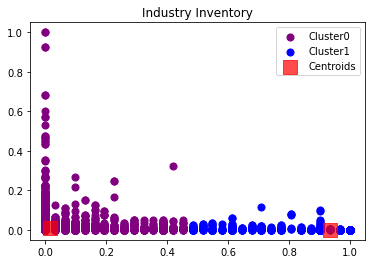

In [21]:
# Visualizing the clusters for k equals to 2

plt.scatter(X[y_predicted==0,1],X[y_predicted==0,0],s=50, c='purple',label='Cluster0')
plt.scatter(X[y_predicted==1,1],X[y_predicted==1,0],s=50, c='blue',label='Cluster1')

plt.scatter(model.cluster_centers_[:,1],model.cluster_centers_[:,0], s=200,marker='s', c='red', alpha=0.7, label='Centroids')
plt.title('Industry Inventory')
plt.legend()
plt.show()

In [22]:
# To show all Data in the cluster 0
kluster0 = data_inventori3[data_inventori3["Cluster"]==0]
kluster0

,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH,Cluster
0,19.0,0.0,27.0,1.0,12.0,27.0,0.0,3.0,5.0,23.0,54.0,46.000,0
1,2.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,11.0,171.0,235.000,0
2,0.0,0.0,8.0,0.0,8.0,8.0,0.0,3.0,5.0,7.0,0.0,0.000,0
3,4.0,0.0,15.0,0.0,15.0,15.0,0.0,2.0,5.0,19.0,74.0,94.000,0
4,4.0,0.0,8.0,0.0,8.0,8.0,0.0,2.0,5.0,21.0,128.0,336.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12626,0.0,0.0,11.0,0.0,4.0,4.0,7.0,2.0,2.0,48.0,108.0,1.296,0
12627,0.0,0.0,9.0,0.0,5.0,5.0,4.0,1.0,2.0,9.0,135.0,243.000,0
12628,10.0,0.0,23.0,0.0,22.0,23.0,0.0,4.0,12.0,22.0,52.0,50.000,0
12629,45.0,0.0,37.0,1.0,28.0,37.0,0.0,4.0,12.0,34.0,26.0,24.000,0


In [23]:
# To show all Data in the cluster 1
kluster1 = data_inventori3[data_inventori3["Cluster"]==1]
kluster1

,Sales,Stock Out,PKM Exist,Avg Sales / Hari,MPKM Toko,PKM Toko,N+,Min Disp,Minor,Stock,DSI PKM,DSI OH,Cluster
7,0.0,31.0,9.0,0.0,9.0,9.0,0.0,1.0,6.0,12.0,0.0,0.0,1
10,0.0,31.0,9.0,0.0,9.0,9.0,0.0,2.0,6.0,0.0,0.0,0.0,1
11,0.0,31.0,9.0,0.0,9.0,9.0,0.0,2.0,6.0,6.0,0.0,0.0,1
127,0.0,31.0,5.0,0.0,5.0,5.0,0.0,3.0,2.0,0.0,0.0,0.0,1
131,0.0,31.0,60.0,0.0,48.0,48.0,12.0,4.0,24.0,48.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12601,0.0,28.0,25.0,0.0,25.0,25.0,0.0,2.0,5.0,0.0,0.0,0.0,1
12602,0.0,28.0,300.0,0.0,300.0,300.0,0.0,0.0,50.0,0.0,0.0,0.0,1
12607,0.0,28.0,4.0,0.0,4.0,4.0,0.0,2.0,2.0,0.0,324.0,0.0,1
12608,0.0,28.0,6.0,0.0,6.0,6.0,0.0,2.0,4.0,0.0,26.0,0.0,1


In [24]:
# serializing our model to a file called model.pkl
import pickle
pickle.dump(model, open("model.pkl","wb"))

In [25]:
#Load Model
loaded_model = pickle.load(open("model.pkl","rb")) # load the model
loaded_model.predict(X)

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,

# 4. Model Evaluation

In [26]:
# To show score of Silhouette Coefficient
silhouette_score(X, model.labels_)

0.8883761753249901